<a href="https://colab.research.google.com/github/raokiey/colorization-of-point-cloud-data-using-pdal/blob/main/pdal_colorizing_points_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PDALを用いた3次元点群データの着色方法
このノートブックは、[FOSS4G Advent Calendar 2024の19日目の記事](https://qiita.com/ra0kley/items/ce7d0e595651b7760cf7)の補足用に作成したものです。  
PDALを用いた3次元点群データの着色処理および可視化を行っていきます。  

## 0. セットアップ
必要なライブラリなどをインストールします。  
⚠️ condaを用いてライブラリをインストールしているため、クラッシュする可能性が高いです。  
**クラッシュした場合は、ランタイムが自動的に再起動されると思いますので、再実行してください。**  

In [1]:
# Google Colab上でcondaを使うために`condacolab`をインストール
!pip install -q condacolab
import condacolab
condacolab.install_mambaforge()
condacolab.check()

✨🍰✨ Everything looks OK!
✨🍰✨ Everything looks OK!


In [2]:
# gdalとpdalのインストール
!mamba install -q -c conda-forge gdal pdal proj sqlite laspy matplotlib plotly numpy

Preparing transaction: ...working... done
Verifying transaction: ...working... done
Executing transaction: ...working... 
To enable CUDA support, UCX requires the CUDA Runtime library (libcudart).
The library can be installed with the appropriate command below:

* For CUDA 11, run:    conda install cudatoolkit cuda-version=11
* For CUDA 12, run:    conda install cuda-cudart cuda-version=12



To enable CUDA support, please follow UCX's instruction above.

To additionally enable NCCL support, run:    conda install nccl



On Linux, Open MPI is built with CUDA awareness but it is disabled by default.
To enable it, please set the environment variable
OMPI_MCA_opal_cuda_support=true
before launching your MPI processes.
Equivalently, you can set the MCA parameter in the command line:
mpiexec --mca opal_cuda_support 1 ...
Note that you might also need to set UCX_MEMTYPE_CACHE=n for CUDA awareness via
UCX. Please consult UCX documentation for further details.


done


## 1. データの準備

このノートブックでは、神奈川県が公開している[「神奈川県 横浜北部、川崎3次元点群データ」](https://www.geospatial.jp/ckan/dataset/kanagawa-2022-pointcloud)を用いていきます。  
この章では、使用するデータの準備を行っていきます。  

### 1.1 データのダウンロード
着色対象の3次元点群データと着色に使用するオルソ画像をG空間情報センターからダウンロードします。  
このノートブックでは、ダウンロードした3次元点群データを`./sample_data/point_cloud/`に、オルソ画像を`./sample_data/ortho/`に保存します。

In [3]:
# 3次元点群データのダウンロード
!wget -P ./sample_data/point_cloud "https://gic-kanagawa.s3.ap-northeast-1.amazonaws.com/div/2022/orglas/09MD0512.zip" && \
unzip ./sample_data/point_cloud/09MD0512.zip -d ./sample_data/point_cloud && \
rm ./sample_data/point_cloud/09MD0512.zip

--2025-01-02 09:05:05--  https://gic-kanagawa.s3.ap-northeast-1.amazonaws.com/div/2022/orglas/09MD0512.zip
Resolving gic-kanagawa.s3.ap-northeast-1.amazonaws.com (gic-kanagawa.s3.ap-northeast-1.amazonaws.com)... 52.219.1.3, 3.5.156.15, 52.219.9.38, ...
Connecting to gic-kanagawa.s3.ap-northeast-1.amazonaws.com (gic-kanagawa.s3.ap-northeast-1.amazonaws.com)|52.219.1.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 115367448 (110M) [application/x-zip-compressed]
Saving to: ‘./sample_data/point_cloud/09MD0512.zip’

09MD0512.zip        100%[===================>] 110.02M  12.6MB/s    in 10s     

2025-01-02 09:05:16 (10.8 MB/s) - ‘./sample_data/point_cloud/09MD0512.zip’ saved [115367448/115367448]

Archive:  ./sample_data/point_cloud/09MD0512.zip
  inflating: ./sample_data/point_cloud/09MD0512.las  


In [4]:
# オルソ画像のダウンロード
!wget -P ./sample_data/ortho "https://gic-kanagawa.s3.ap-northeast-1.amazonaws.com/div/2022/orttif/09MD0512.zip" && \
unzip ./sample_data/ortho/09MD0512.zip -d ./sample_data/ortho && \
rm ./sample_data/ortho/09MD0512.zip

--2025-01-02 09:06:13--  https://gic-kanagawa.s3.ap-northeast-1.amazonaws.com/div/2022/orttif/09MD0512.zip
Resolving gic-kanagawa.s3.ap-northeast-1.amazonaws.com (gic-kanagawa.s3.ap-northeast-1.amazonaws.com)... 52.219.137.38, 52.219.1.119, 3.5.157.185, ...
Connecting to gic-kanagawa.s3.ap-northeast-1.amazonaws.com (gic-kanagawa.s3.ap-northeast-1.amazonaws.com)|52.219.137.38|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25260335 (24M) [application/x-zip-compressed]
Saving to: ‘./sample_data/ortho/09MD0512.zip’

09MD0512.zip        100%[===================>]  24.09M  10.1MB/s    in 2.4s    

2025-01-02 09:06:16 (10.1 MB/s) - ‘./sample_data/ortho/09MD0512.zip’ saved [25260335/25260335]

Archive:  ./sample_data/ortho/09MD0512.zip
  inflating: ./sample_data/ortho/09md0512.tfw  
  inflating: ./sample_data/ortho/09md0512.tif  


ダウンロードした着色対象の3次元点群データ  

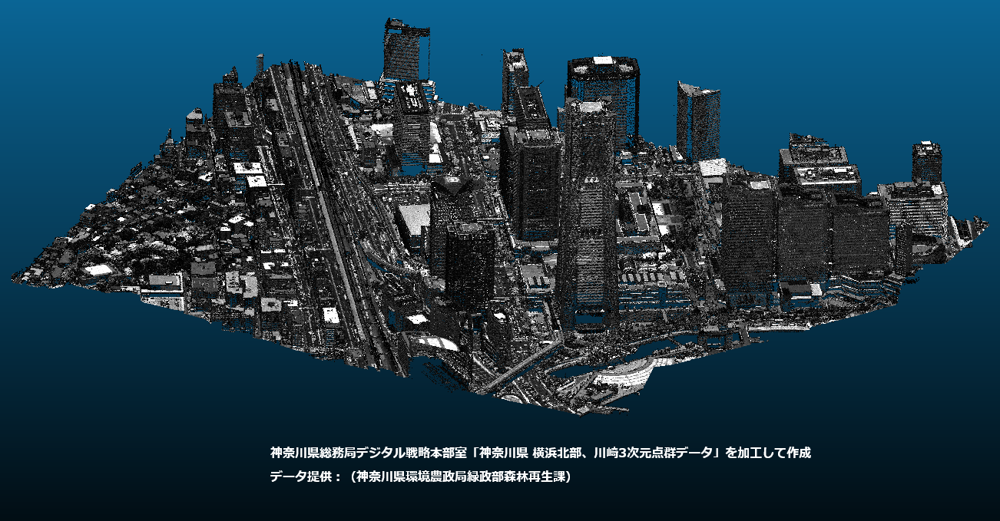

ダウンロードした着色に使用するオルソ画像  

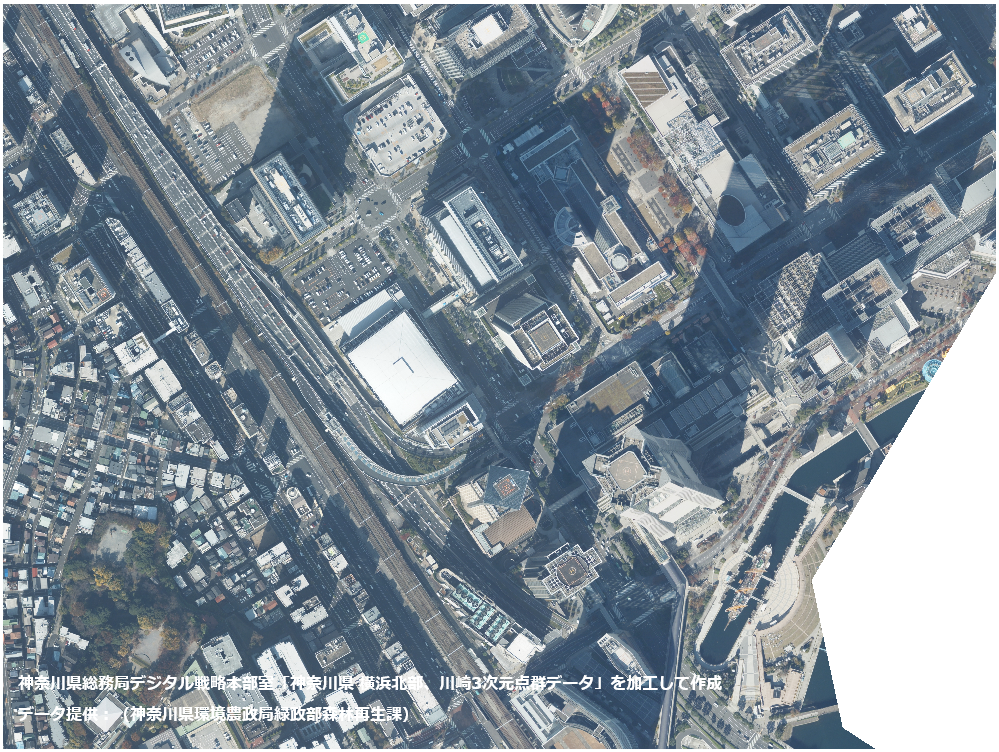

## 1.2 前準備
今回ダウンロードした3次元点群データとオルソ画像には、座標参照系（CRS）が設定されていません。  
この状態のままだと、GIS上でデータが正しく表示されなかったり、着色処理が失敗したりします。   
そのため、ダウンロードしたデータに適切なCRSを設定する必要があります。  

国土基本図の図郭名の最初の数字（09）は、平面直角座標系の系番号を表しています。  
このデータの場合は、平面直角座標系第Ⅸ系（EPSG:6677）を設定します。  


In [5]:
import os
import json
import pdal

from osgeo import gdal

os.environ['PROJ_LIB'] = '/usr/local/share/proj'

In [6]:
# 3次元点群データのCRSを設定
!pdal translate -i ./sample_data/point_cloud/09MD0512.las -o ./sample_data/point_cloud/09MD0512_EPSG6677.las --writers.las.a_srs="EPSG:6677"

In [7]:
# オルソ画像のCRSを設定、8bitを16bitに変換
!gdal_translate -ot UInt16  -a_srs EPSG:6677 -scale 0 255 0 65535 ./sample_data/ortho/09md0512.tif ./sample_data/ortho/09MD0512_EPSG6677.tif

Input file size is 4000, 3000
0...10...20...30...40...50...60...70...80...90...100 - done.


## 2. 着色処理

## 2.1 パイプラインの定義
PDALでは、複雑な操作を行うときにJSON形式でパイプラインを定義し、実行できます。  
ここでは、着色処理を行うパイプラインを定義していきます。

In [8]:
# パイプラインをJSON形式で定義
pipeline_json = {
    "pipeline": [
        "./sample_data/point_cloud/09MD0512_EPSG6677.las",
        {
            "type": "filters.colorization",
            "raster": "./sample_data/ortho/09MD0512_EPSG6677.tif"
        },
        {
            "type": "writers.las",
            "compression": "true",
            "minor_version": "2",
            "dataformat_id": "3",
            "filename": "./sample_data/09MD0512_colorized.laz"
        }
    ]
}

## 2.2 定義したパイプラインの実行  
上で定義したパイプラインを実行します。  
定義したパイプラインをJSON形式のファイルに出力して、`pdal pipeline {パイプラインのJSONファイルのパス}`で実行する方がメジャーですが、このノートブックではPython上で動かしていきます。  

In [9]:
# パイプラインオブジェクトの作成
pipeline = pdal.Pipeline(json.dumps(pipeline_json))

In [10]:
# パイプラインを実行
pipeline.execute()

8545193

## 3. 着色した3次元点群データの可視化
Pythonの可視化ライブラリの1つである[Plotly](https://plotly.com/python/)を用いて、着色処理した点群データを可視化します。  
下の例は、**元の3次元点群データから3%をランダムにサンプリングして表示したものです。元のデータより点の密度が非常に低くなっていることに注意してください。**  

In [11]:
import laspy
import numpy as np
import plotly.graph_objects as go

In [12]:
# 着色した3次元点群データをlaspyを用いて読み込み、NumPyの配列形式に変換
laz = laspy.read('./sample_data/09MD0512_colorized.laz')
points = np.vstack((laz.x, laz.y, laz.z)).transpose()

In [13]:
# 8bitに変換したRGB値を取得
red = laz.red // 256
green = laz.green // 256
blue = laz.blue // 256
colors = np.vstack((red, green, blue)).transpose()
# RGB値をPlotlyで色付けできるように変換
color_info_list = [f"rgb({int(r)},{int(g)},{int(b)})" for r, g, b in colors]

In [14]:
num_points = points.shape[0]

sample_rate = 0.03  # 全体の3%をサンプリング

# ランダムサンプリングのインデックス
sample_indices = np.random.choice(num_points, int(num_points * sample_rate), replace=False)

# サンプリングされた点群データ
points_sampled = points[sample_indices]

# サンプリングされたPlotly用の色情報
colors_sampled = [color_info_list[i] for i in sample_indices]

In [15]:
# Plotlyの3D散布図を用いて、3次元点群データを可視化
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=points_sampled[:, 0],
            y=points_sampled[:, 1],
            z=points_sampled[:, 2],
            mode='markers',
            marker=dict(
                size=1,
                color=colors_sampled,
                opacity=1.0
            ),
        )
    ]
)
fig.update_layout(scene=dict(aspectmode='data'))
fig.show()

3次元点群データを扱うソフトウェアの1つである[CloudCompare](https://www.danielgm.net/cc/)でサンプリングせずに可視化すると以下のようになります。  

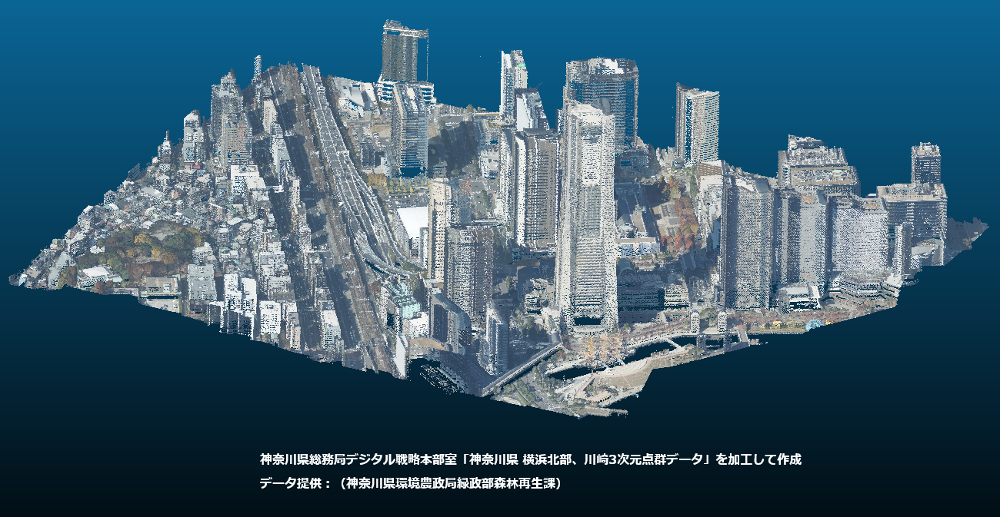